In [12]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import umap
from sklearn.decomposition import PCA
import scanpy as sc
import matplotlib as mpl
import warnings
import json
from PIL import Image
import torch
import seaborn
from torch import nn
import torch.nn.functional as F
import cv2
from tqdm import tqdm

In [2]:
from matplotlib.colors import ListedColormap
from matplotlib.colors import rgb2hex
cmap_tab10 = plt.get_cmap("tab10")
cmap_tab20 = plt.get_cmap("tab20")
cmap_tab20_reorder = cmap_tab10.colors + cmap_tab20.colors[1::2]
cmap_tab20_reorder = ListedColormap(cmap_tab20_reorder)

In [3]:
fit = umap.UMAP(n_components=3, min_dist=0.5)

In [4]:
from open_clip import create_model_from_pretrained, get_tokenizer
import open_clip

In [5]:
def plot_similarity_heatmap(dot_similarity, img_similarity, txt_similarity, target):
    
    fig, axes = plt.subplots(3, 4, figsize=(33, 20))
    seaborn.heatmap(dot_similarity.cpu().detach().numpy(), cmap="rainbow", ax=axes[0, 0])
    seaborn.heatmap(img_similarity.cpu().detach().numpy(), cmap="rainbow", ax=axes[0, 1])
    seaborn.heatmap(txt_similarity.cpu().detach().numpy(), cmap="rainbow", ax=axes[0, 2])
    seaborn.heatmap(target, cmap="rainbow", ax=axes[0, 3])
    seaborn.heatmap(dot_similarity.cpu().detach().numpy(), cmap="crest", ax=axes[1, 0])
    seaborn.heatmap(img_similarity.cpu().detach().numpy(), cmap="crest", ax=axes[1, 1])
    seaborn.heatmap(txt_similarity.cpu().detach().numpy(), cmap="crest", ax=axes[1, 2])
    seaborn.heatmap(target, cmap="crest", ax=axes[1, 3])
    seaborn.heatmap(dot_similarity.cpu().detach().numpy(), ax=axes[2, 0])
    seaborn.heatmap(img_similarity.cpu().detach().numpy(), ax=axes[2, 1])
    seaborn.heatmap(txt_similarity.cpu().detach().numpy(), ax=axes[2, 2])
    seaborn.heatmap(target, ax=axes[2, 3])

In [6]:
S = 5
COLORMAP = cmap_tab20_reorder

In [10]:
DEVICE = 'cuda'

In [23]:
PATCH_DIR = "../data/image_caption/Pubmed_set/pubmed_set/images"

In [24]:
DATAFRAME = pd.read_csv('../data/image_caption/Pubmed_set/pubmed_set_data_info.csv', index_col=0)
DATAFRAME

,caption
image id,
3f93c716-8fc9-42e9-bc29-bec52a51ab4b.jpg,"ER expression in tumor tissue. IHC staining, o..."
9fcdf1e1-139c-4b63-bf1a-79d83c71f41a.jpg,Nuclear expression of TS (brown) in a colon ca...
00f1ad7a-f4b0-4938-b874-089d40a123ce.jpg,Nuclear expression of E2F1 (brown) in a colon ...
9d3aef30-7c8b-4b78-9acf-ec523f952650.jpg,Cytoplasmic immunoexpression of PD-L1 in oral ...
b317d529-3626-49fc-9282-e4f28cf3d1cb.jpg,Nuclear and perinuclear immunoexpression of Fo...
...,...
8f614f0e-0ce0-4fd4-9b4e-987ac9aa258d.jpg,Cerebellar cortex. An abnormal swelling of the...
03c4aef1-e0eb-4ebf-bc5b-b67847c4e811.jpg,A. Cerebellar cortex. Segmental loss of Purkin...
d00a11f7-cfcb-4bc6-b421-0f91757ef0d3.jpg,B. Cerebellar cortex. The most preserved regio...


# Before 

In [25]:
model, preprocess = create_model_from_pretrained('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224', device = DEVICE)
tokenizer = get_tokenizer('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224')

text_features = pd.DataFrame()
image_features = pd.DataFrame()

warnings.simplefilter(action='ignore')
for patch_idx in tqdm(DATAFRAME.index):
    text = DATAFRAME[DATAFRAME.index==patch_idx]['caption'][0]
    text_input = tokenizer([text]).to(DEVICE)
    image = Image.open(os.path.join(PATCH_DIR, patch_idx))
    image_input = torch.stack([preprocess(image)]).to(DEVICE)
    with torch.no_grad():
        text_features[patch_idx] = model.encode_text(text_input).cpu().detach().numpy()[0]
        image_features[patch_idx] = model.encode_image(image_input).cpu().detach().numpy()[0]

100%|██████████| 3309/3309 [05:20<00:00, 10.34it/s]


In [26]:
image_embeddings_n = F.normalize(torch.tensor(image_features.values).T, p=2, dim=-1)
text_embeddings_n = F.normalize(torch.tensor(text_features.values).T, p=2, dim=-1)
dot_similarity = text_embeddings_n @ image_embeddings_n.T
img_similarity = image_embeddings_n @ image_embeddings_n.T
txt_similarity = text_embeddings_n @ text_embeddings_n.T
target = (txt_similarity.cpu().detach().numpy() + img_similarity.cpu().detach().numpy())/2

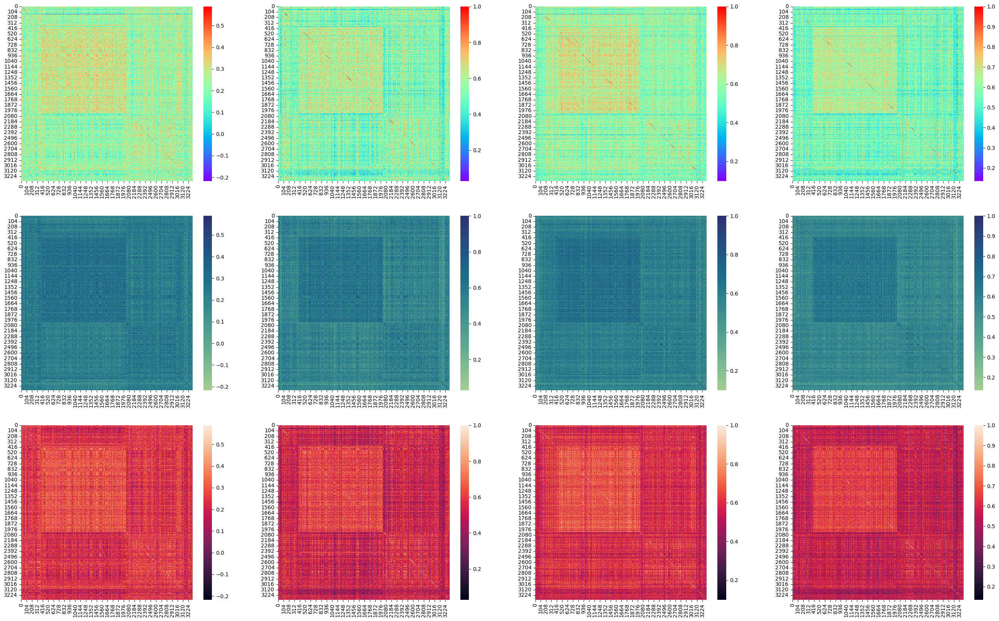

In [27]:
plot_similarity_heatmap(dot_similarity, img_similarity, txt_similarity, target)

# After 1

In [28]:
model_dir = "2024_06_14-09_34_24-model_hf-hub:microsoft-BiomedCLIP-PubMedBERT_256-vit_base_patch16_224-lr_5e-06-b_64-j_8-p_amp"

In [32]:
epoch_n = "epoch_1.pt"
model_path = os.path.join("../open_clip-main/logs", model_dir, "checkpoints", epoch_n)
model, preprocess = create_model_from_pretrained('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224', device = DEVICE, pretrained=model_path)
tokenizer = get_tokenizer('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224')

text_features = pd.DataFrame()
image_features = pd.DataFrame()

warnings.simplefilter(action='ignore')
for patch_idx in tqdm(DATAFRAME.index):
    text = DATAFRAME[DATAFRAME.index==patch_idx]['caption'][0]
    text_input = tokenizer([text]).to(DEVICE)
    image = Image.open(os.path.join(PATCH_DIR, patch_idx))
    image_input = torch.stack([preprocess(image)]).to(DEVICE)
    with torch.no_grad():
        text_features[patch_idx] = model.encode_text(text_input).cpu().detach().numpy()[0]
        image_features[patch_idx] = model.encode_image(image_input).cpu().detach().numpy()[0]

100%|██████████| 3309/3309 [05:12<00:00, 10.60it/s]


In [33]:
image_embeddings_n = F.normalize(torch.tensor(image_features.values).T, p=2, dim=-1)
text_embeddings_n = F.normalize(torch.tensor(text_features.values).T, p=2, dim=-1)
dot_similarity = text_embeddings_n @ image_embeddings_n.T
img_similarity = image_embeddings_n @ image_embeddings_n.T
txt_similarity = text_embeddings_n @ text_embeddings_n.T
target = (txt_similarity.cpu().detach().numpy() + img_similarity.cpu().detach().numpy())/2

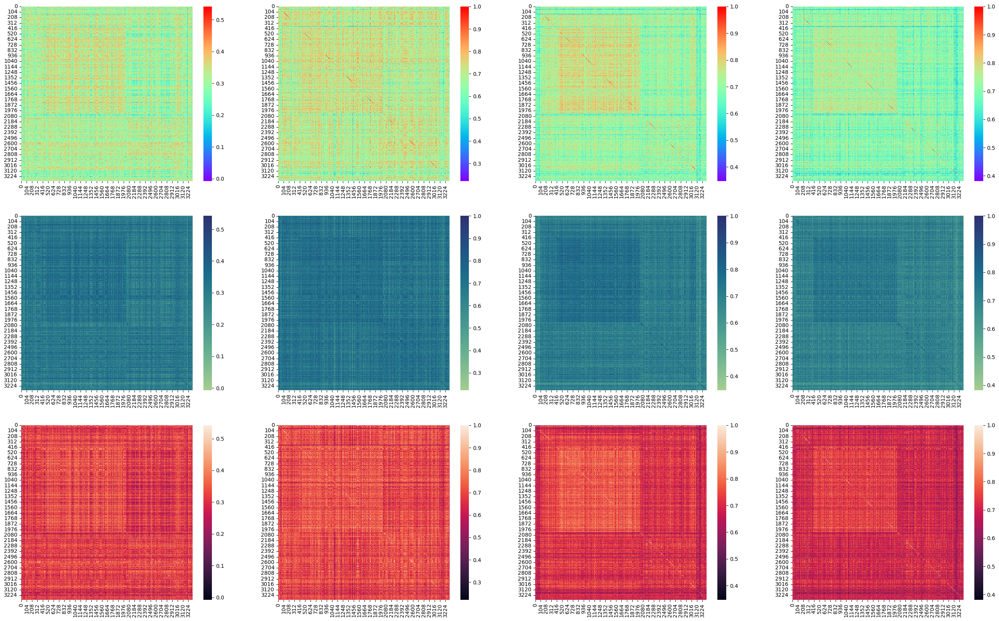

In [34]:
plot_similarity_heatmap(dot_similarity, img_similarity, txt_similarity, target)